In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

from velotrace.visualization import *
from velotrace.sample import create_batch
from velotrace.model import ODEFunc, ODEBlock, LinearWeightedMSE

SEED = 2024
np.random.seed(SEED)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda:0


In [2]:
adata_update = sc.read_h5ad('./data/adata_velotrace.h5ad')
x_update = torch.tensor(adata_update.X, dtype = torch.float).to(device)
t_update = torch.load('./data/t_final.pt').to(device)

input_dim = adata_update.shape[1]

odefunc = ODEFunc(input_dim).to(device)
odeblock = ODEBlock(odefunc).to(device)      
loaded_params = torch.load('./data/checkpoint_final.pth')['odefunc_state_dict']
odefunc.load_state_dict(loaded_params)


t_update_np = t_update.cpu().numpy()
velotrace_velo = odefunc(0, x_update).cpu().detach().numpy()
scv.tl.recover_dynamics(adata_update)
scv.tl.velocity(adata_update, mode='dynamical')

recovering dynamics (using 1/128 cores)


  0%|          | 0/60 [00:00<?, ?gene/s]

    finished (0:00:06) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [4]:
adata_true = sc.read_h5ad('./data/adata_true.h5ad')
adata_scvelo = sc.read_h5ad('./data_to_plot/adata_scvelo.h5ad')
adata_sctour = sc.read_h5ad('./data_to_plot/adata_sctour.h5ad')
adata_utv = sc.read_h5ad('./data_to_plot/adata_unitvelo.h5ad')
adata_velovi = sc.read_h5ad('./data_to_plot/adata_velovi.h5ad')
adata_sctour_x_v = sc.read_h5ad('./data_to_plot/adata_sctour_x_v.h5ad')
adata_velotrace = adata_update.copy()
adata_sctour_4_pca = sc.read_h5ad('./data_to_plot/adata_sctour_4_pca.h5ad')


In [6]:
t_true = adata_scvelo.obs['true_t']
t_init = adata_scvelo.obs['velocity_pseudotime'] * 25
t_slingshot = np.load("./data_to_plot/t_slingshot.npy")

true_velo = cal_velocity(adata_true, t_true)
scvelo_velo = adata_scvelo.layers['velocity'] + adata_scvelo.layers['velocity_u'] 
sctour_velo = adata_sctour_x_v.layers['sctour_velo']
velovi_velo = adata_velovi.layers['velocity']   
utv_velo = adata_utv.layers['velocity'] 

ode_cell, velotrace_velo = calculate_odevelo_cell(
    odefunc, 
    odeblock, 
    torch.Tensor(t_update_np).to(device), 
    torch.Tensor(adata_velotrace.X).to(device)
)

[0.01 0.02 0.01 ... 0.01 0.02 0.01]


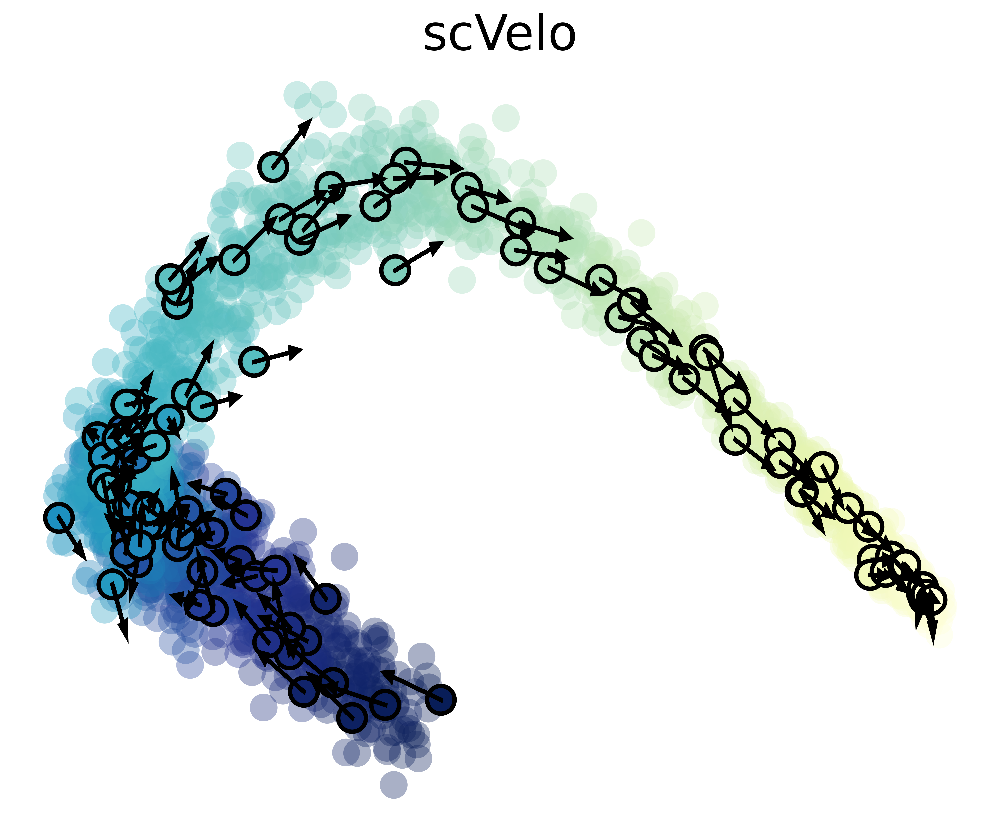

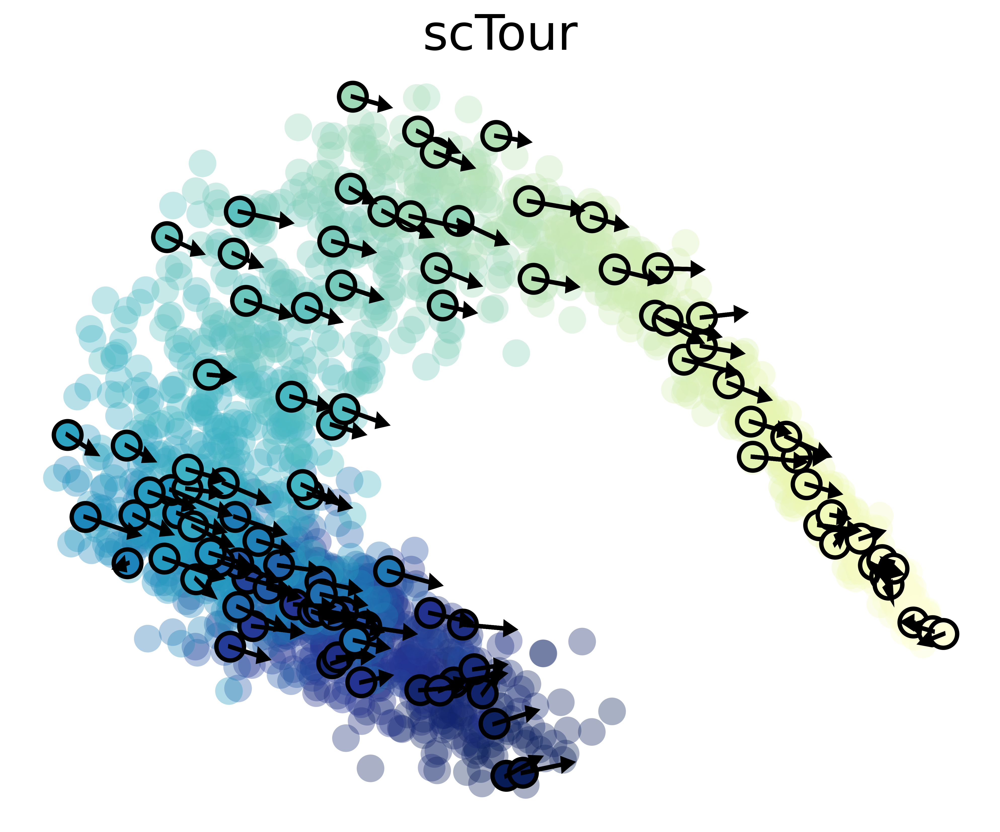

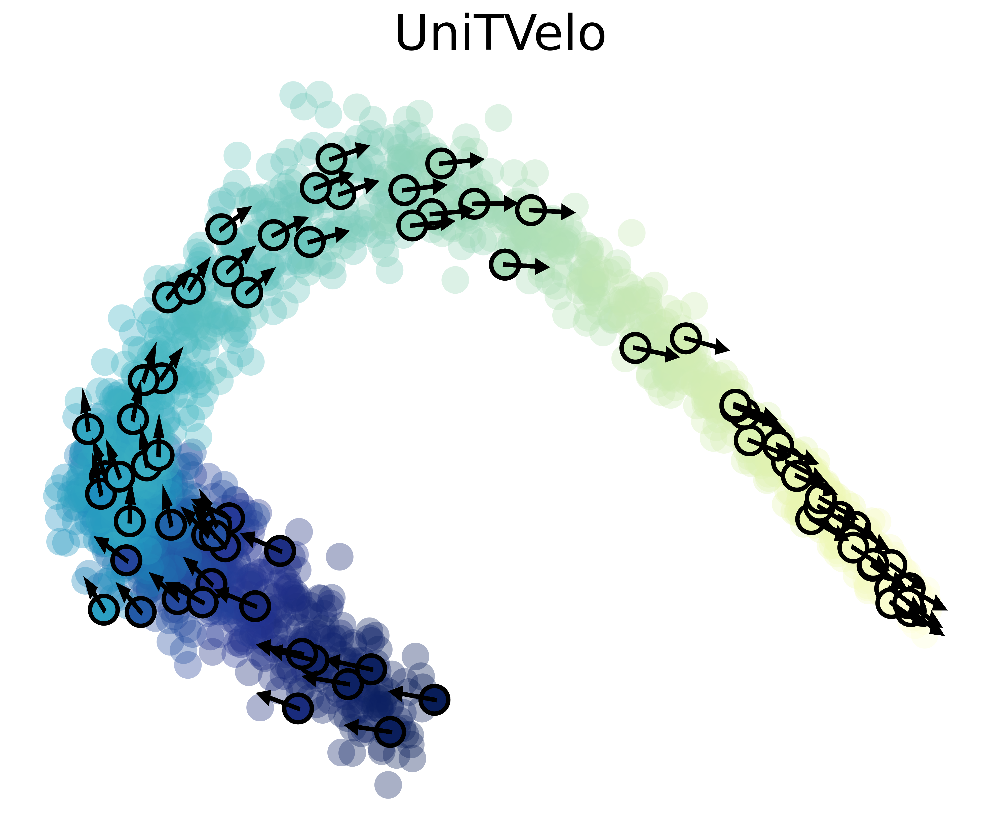

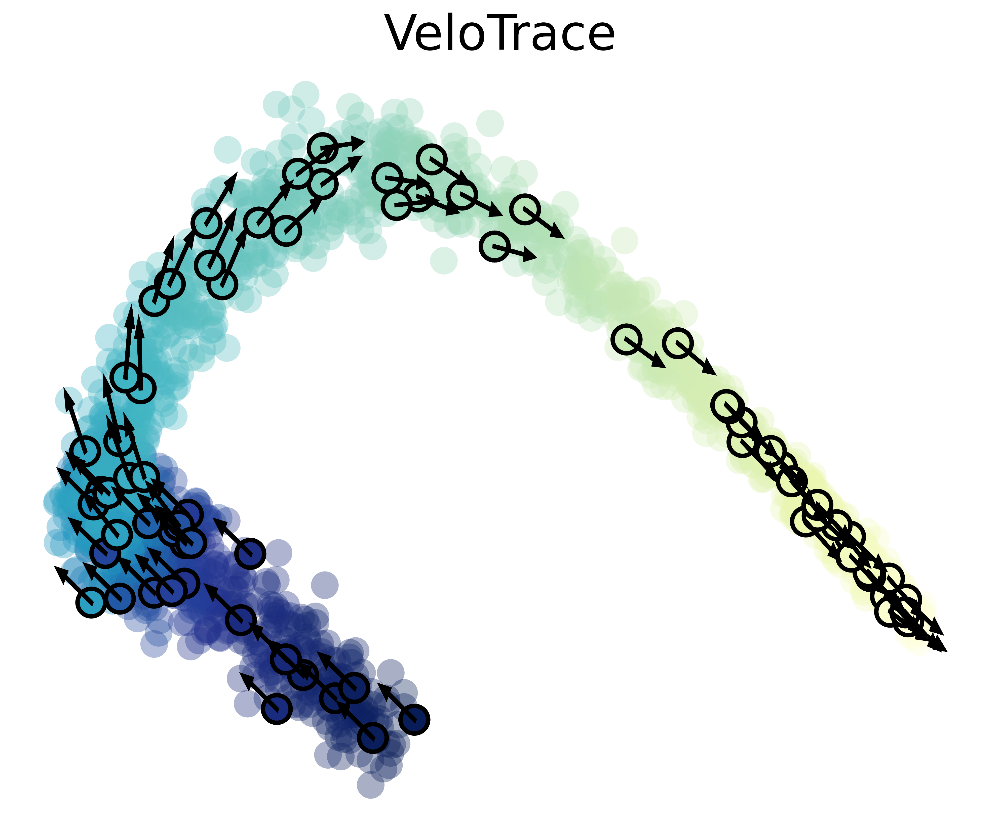

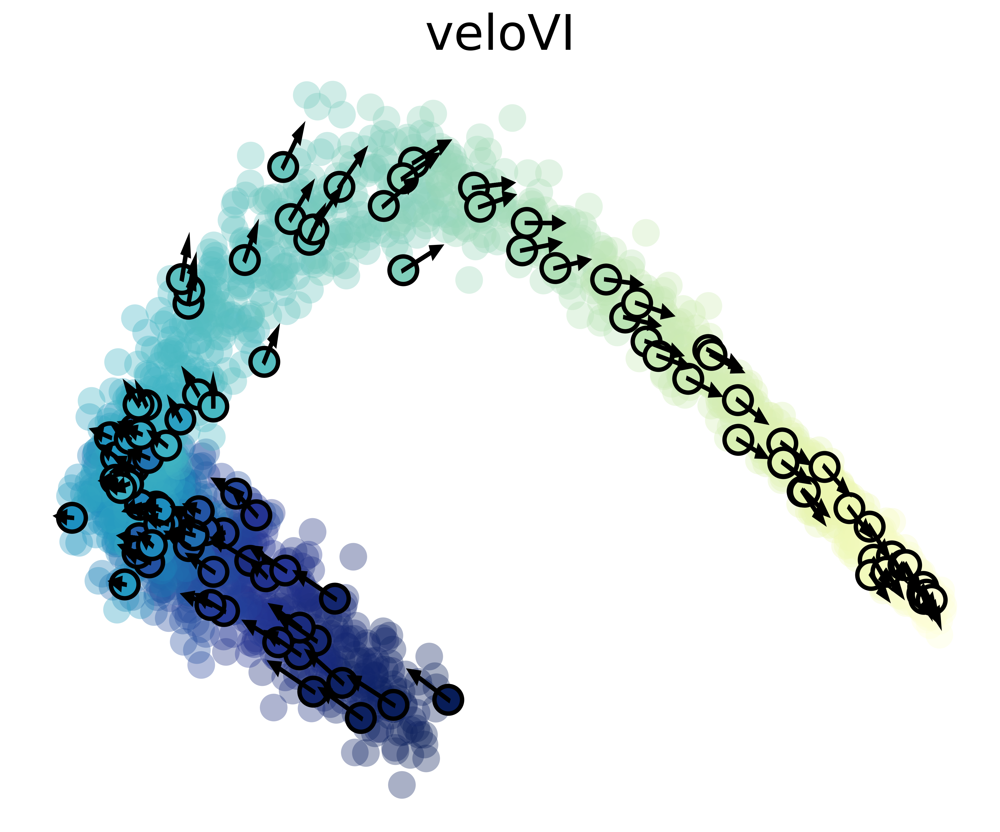

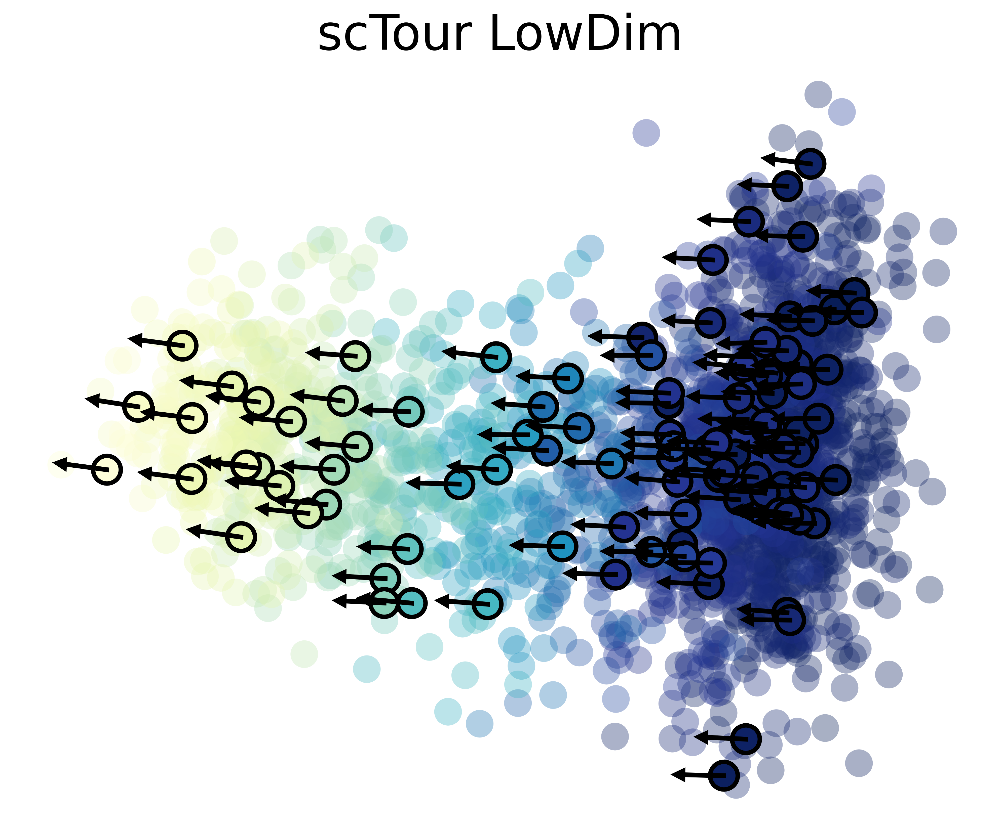

In [7]:
# 1. scVelo, scTour, UniTVelo, VeloTrace, veloVI 的 PCA 流场图
plot_velocity_on_pca(adata_scvelo, scvelo_velo, t_true, step = 0.2, title = "scVelo",)
plot_velocity_on_pca(adata_sctour, sctour_velo, t_true, step = 0.5, title = "scTour")
plot_velocity_on_pca(adata_utv, utv_velo, t_true, step = 0.02, title = "UniTVelo")
plot_velocity_on_pca(adata_velotrace, velotrace_velo, t_true, step = 0.45, title = "VeloTrace", uniform_arrow=True)
plot_velocity_on_pca(adata_velovi, velovi_velo, t_true, step = 0.5, title = "veloVI")

# 2. 特殊处理的 scTour 低维投影
plot_sctour_velocity_on_pca2(
    adata=adata_sctour_4_pca, 
    t=adata_sctour_4_pca.obs['ptime'], 
    step=0.05,  
    title="scTour LowDim"
)

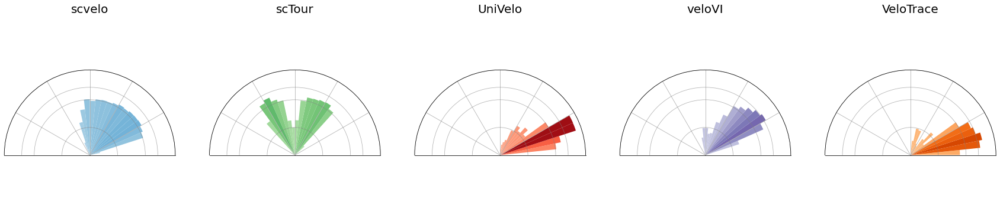

In [ ]:
# 1. 计算角度
angle_gt_ode = angle_between_vectors(true_velo, velotrace_velo)
angle_gt_scvelo = angle_between_vectors(true_velo, scvelo_velo)
angle_gt_sctour = angle_between_vectors(true_velo, adata_sctour_x_v.layers['sctour_velo'])
angle_gt_unitvelo = angle_between_vectors(true_velo, utv_velo)
angle_gt_velovi = angle_between_vectors(true_velo, velovi_velo)

# 2. 配置 Rose Plot 参数
MY_BOUNDARY_CFG = {'val': 100, 'pos': 0.65, 'max': 700}
MY_TICKS = [0, 50, 100, 350, 700]
GLOBAL_NORM = plt.Normalize(vmin=0, vmax=700)

# 3. 绘图
fig, axes = plt.subplots(1, 5, figsize=(30, 6.5), subplot_kw={'projection': 'polar'})

plot_rose_plot_final(axes[0], angle_gt_scvelo, 'scvelo', 'Blues', GLOBAL_NORM, boundary_config=MY_BOUNDARY_CFG, custom_yticks=MY_TICKS)
plot_rose_plot_final(axes[1], angle_gt_sctour, 'scTour', 'Greens', GLOBAL_NORM, boundary_config=MY_BOUNDARY_CFG, custom_yticks=MY_TICKS)
plot_rose_plot_final(axes[2], angle_gt_unitvelo, 'UniVelo', 'Reds', GLOBAL_NORM, boundary_config=MY_BOUNDARY_CFG, custom_yticks=MY_TICKS)
plot_rose_plot_final(axes[3], angle_gt_velovi, 'veloVI', 'Purples', GLOBAL_NORM, boundary_config=MY_BOUNDARY_CFG, custom_yticks=MY_TICKS)
plot_rose_plot_final(axes[4], angle_gt_ode, 'VeloTrace', 'Oranges', GLOBAL_NORM, boundary_config=MY_BOUNDARY_CFG, custom_yticks=MY_TICKS)
plt.show()